<a href="https://colab.research.google.com/github/LongNguyen1984/GANLearning/blob/main/FirstGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [19]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Traning dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

torch.manual_seed(0) # Set for testing purposes please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

### Generator

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
  """ Function for returning a block of the generator's neural network
  given input and output dimensions.
  Parameters:
    input_dim: the dimension of the input vector, a scalar
    outout_dim: the dimension of the output vector, a scalar
  Returns:
    a generator neural network layer, with a linear transformation
    followed by a batch normalization and then a relu activation
  """
  return nn.Sequential(
      # Hint: Replace all of the "None" with the appropriate dimensions.
      # The documentation may be useful if you're less familiar with PyTorch:
      # https://pytorch.org/docs/stable/nn.html.
      #### START CODE HERE ####
      nn.Linear(input_dim, output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace=True),
      ### END CODE HERE ###
  )
  

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")


Success!


 * Build the generator class.
  - The noise vector dimension
  - The image dimension
  - The initial hidden dimension

  

### Optional hints for Generator

In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen


In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


### Create NOISE

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


### DISCRIMINATOR

In [8]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


* The image dimension
* The hidden dimension

In [10]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


### Traing

* criterion: the loss function
* n_epochs: the number of times you iterate through the entire dataset when training
* z_dim: the dimension of the noise vector
* display_step: how often to display/visualize the images
* batch_size: the number of images per forward/backward pass
* lr: the learning rate
* device: the device type, here using a GPU (which runs CUDA), not CPU

In [12]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [14]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [15]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [16]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [17]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.7548106660842913, discriminator loss: 0.2791154857277873


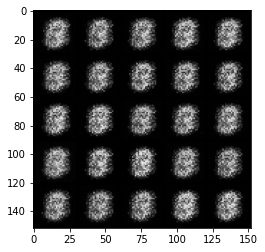

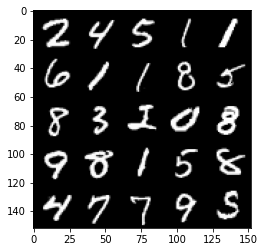

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 2.065286071300507, discriminator loss: 0.1582725710719823


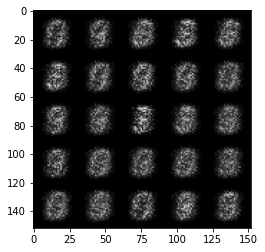

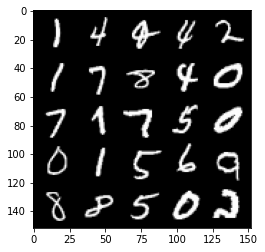

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.6677089240550995, discriminator loss: 0.22764340278506273


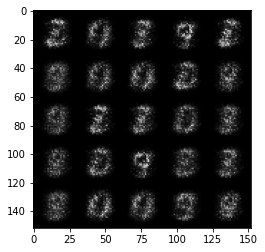

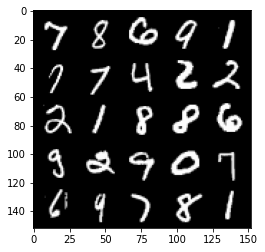

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6488354856967928, discriminator loss: 0.20941331365704552


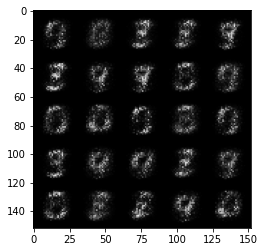

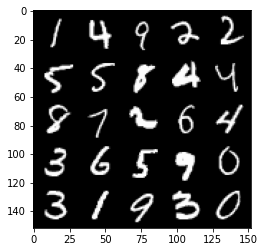

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.890472223997116, discriminator loss: 0.1743980389982463


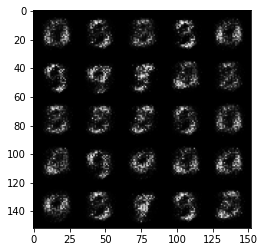

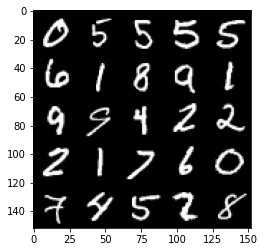

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.304330234289169, discriminator loss: 0.13622853891551479


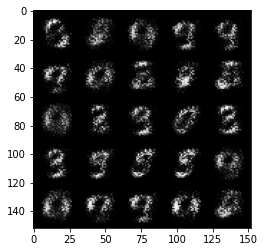

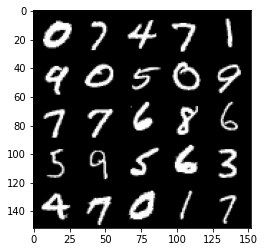

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.7111305065155022, discriminator loss: 0.11060281082987794


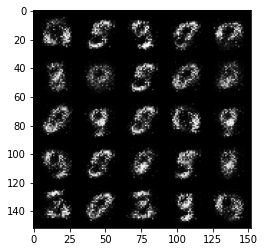

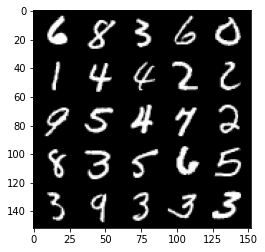

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 3.1636529383659378, discriminator loss: 0.08380294281989331


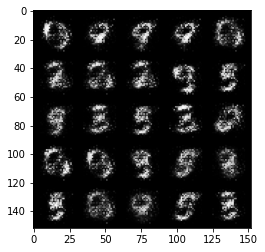

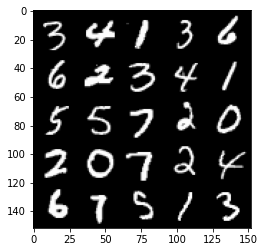

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.474198938369752, discriminator loss: 0.06588929820060727


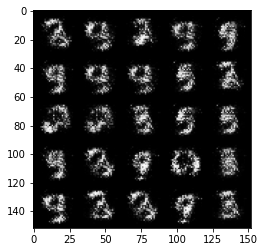

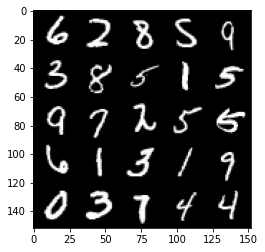

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.8791192760467497, discriminator loss: 0.05512663089483981


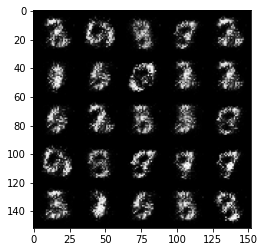

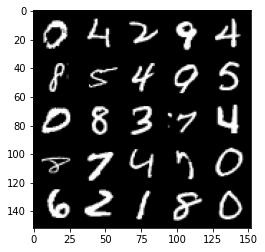

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.9366398420333892, discriminator loss: 0.0562244920469821


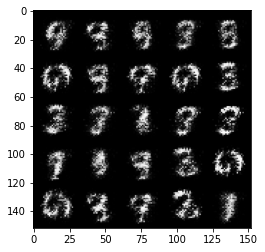

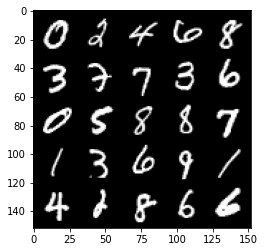

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 4.095758339405062, discriminator loss: 0.05332278122752907


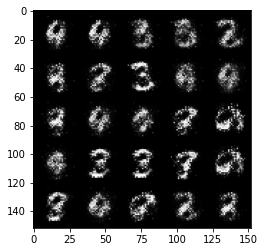

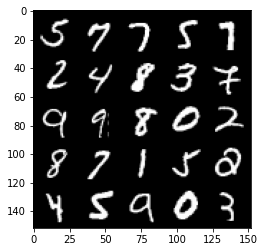

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.133730828285214, discriminator loss: 0.05251893370226027


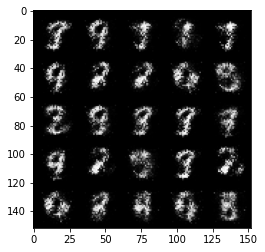

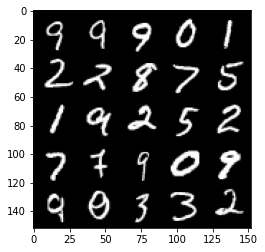

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.013740768432613, discriminator loss: 0.05289196809753772


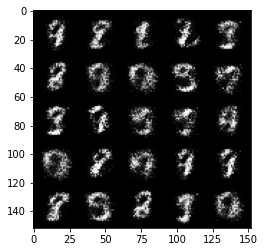

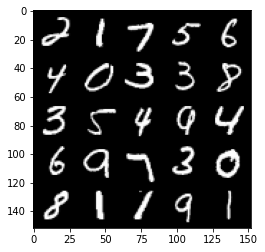

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.281529112815852, discriminator loss: 0.052210801765322674


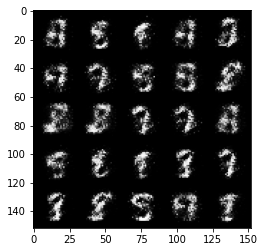

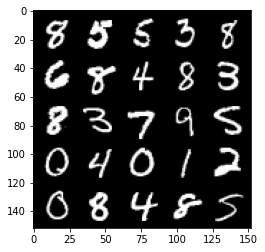

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.328924479007724, discriminator loss: 0.0458139621987939


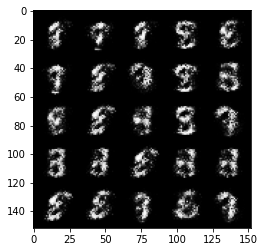

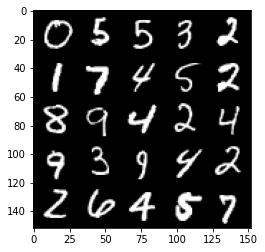

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.281772249221804, discriminator loss: 0.04492400315031408


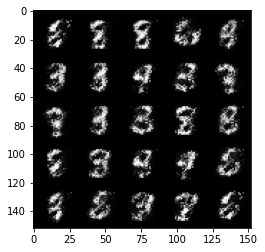

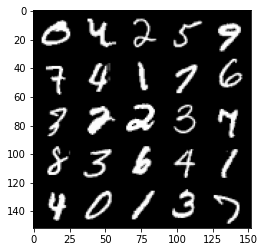

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.198782584190369, discriminator loss: 0.053730516571551555


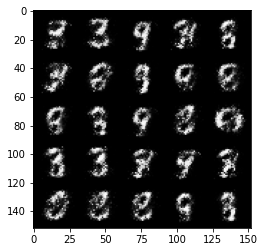

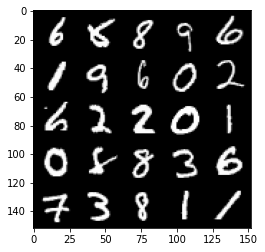

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.397338289737706, discriminator loss: 0.0527897259481251


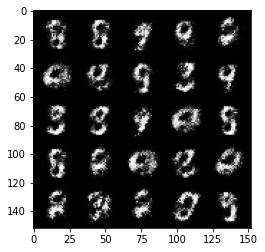

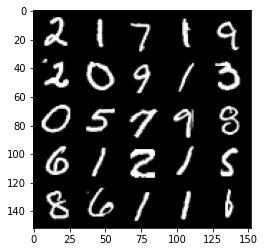

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.395033052444457, discriminator loss: 0.05476534004509451


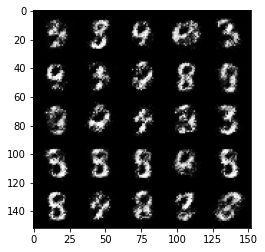

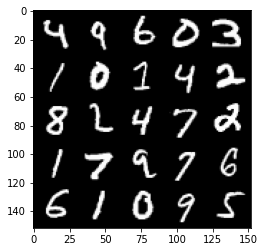

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.132871046543123, discriminator loss: 0.06214582281187181


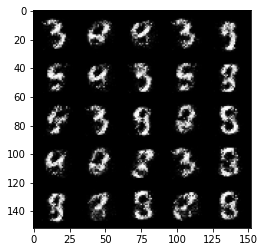

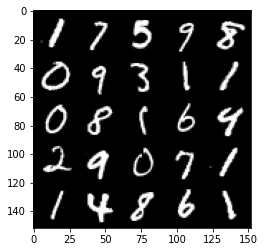

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.280971932411189, discriminator loss: 0.06613493545353406


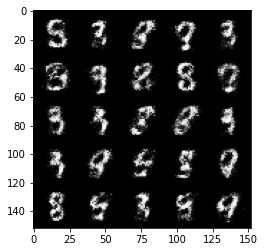

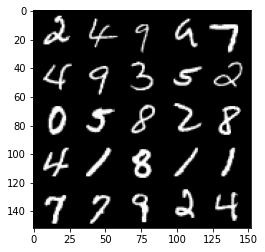

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.401599611759183, discriminator loss: 0.06050643388926983


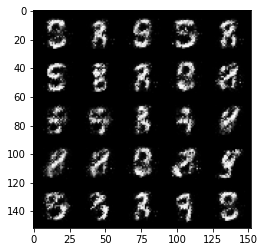

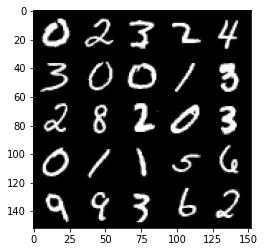

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.216273319244383, discriminator loss: 0.08397990378364914


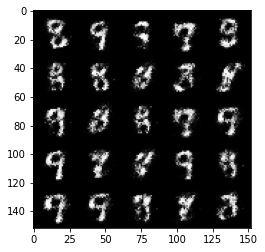

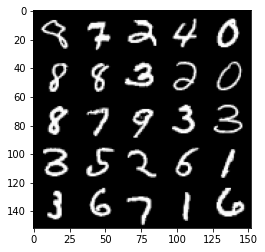

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.104890915870667, discriminator loss: 0.09038265579938887


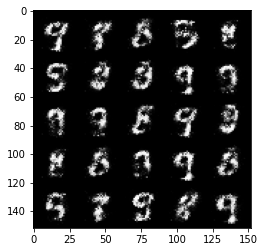

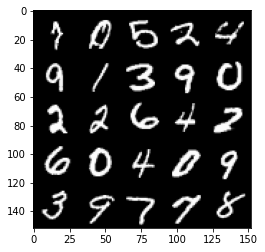

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.124466260910036, discriminator loss: 0.0912465585172178


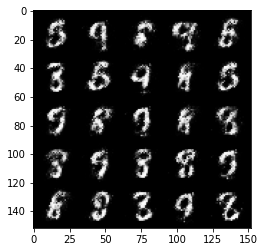

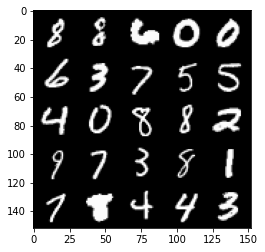

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.8394097948074335, discriminator loss: 0.09527722293138502


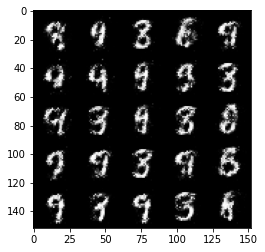

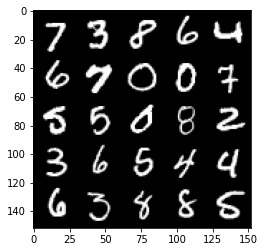

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.862925759792328, discriminator loss: 0.10678673326224095


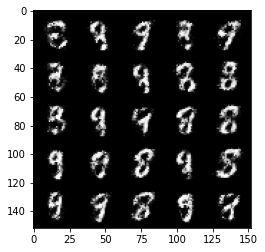

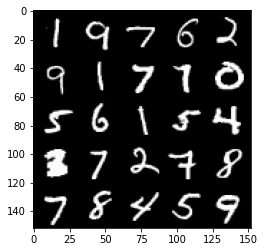

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.749614869594579, discriminator loss: 0.11798815049231053


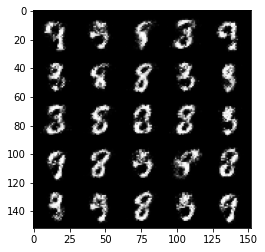

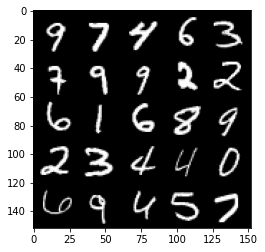

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.637886490344999, discriminator loss: 0.12177773784101012


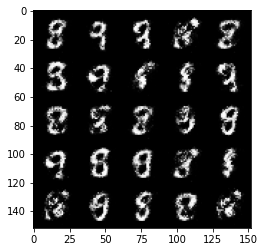

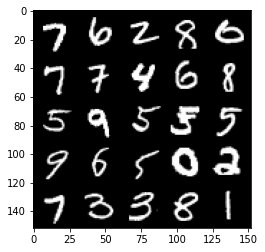

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.5971284298896817, discriminator loss: 0.12657183318585152


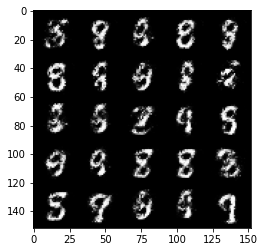

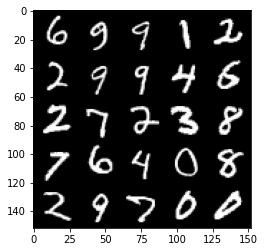

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.6451523704528808, discriminator loss: 0.12312017749249936


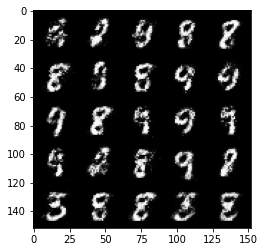

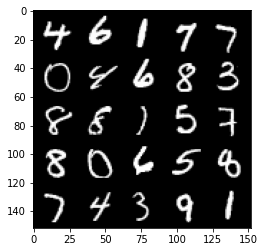

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.475093047142027, discriminator loss: 0.13490625946223736


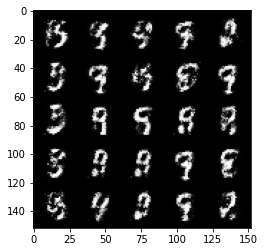

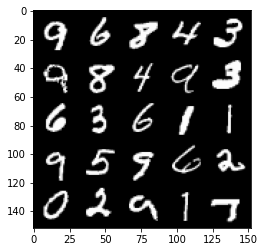

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.4422711524963394, discriminator loss: 0.13207728116214273


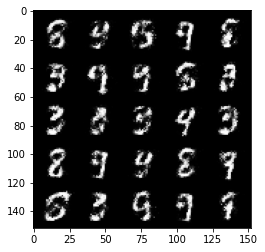

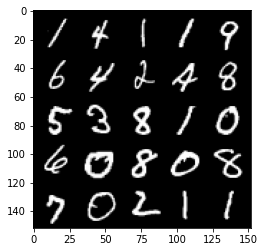

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.3013342351913457, discriminator loss: 0.14181914331018913


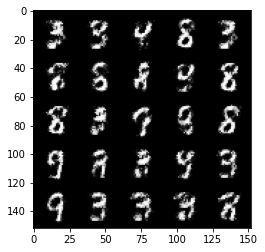

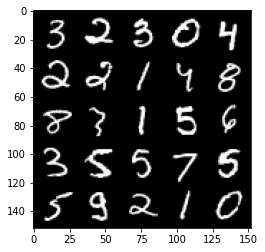

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.3059085974693296, discriminator loss: 0.14659992897510538


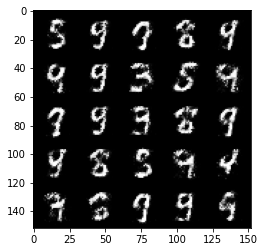

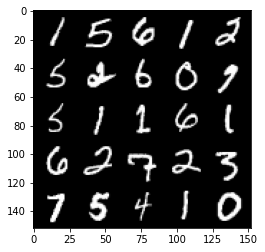

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.3688833236694324, discriminator loss: 0.14090812438726413


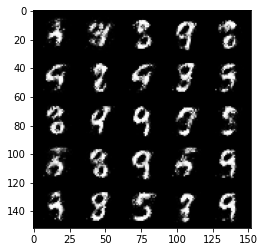

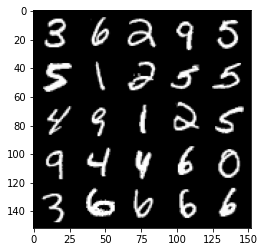

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.2087587804794317, discriminator loss: 0.15189942635595807


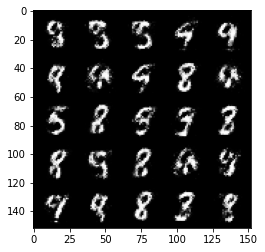

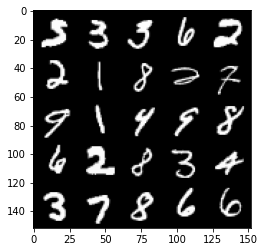

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.1440836510658245, discriminator loss: 0.157940075531602


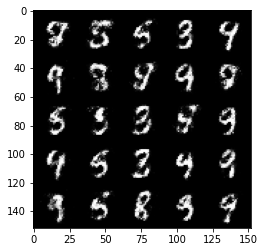

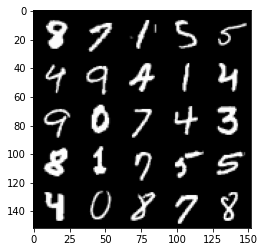

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.1043716363906855, discriminator loss: 0.18222510553896423


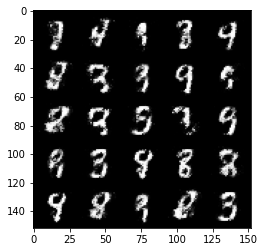

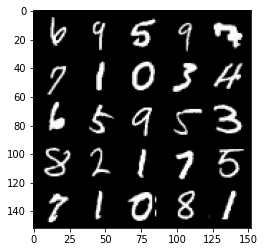

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 2.912054115295407, discriminator loss: 0.19105386757850668


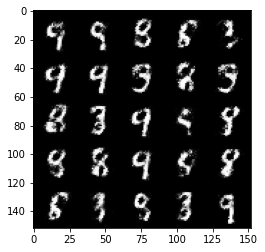

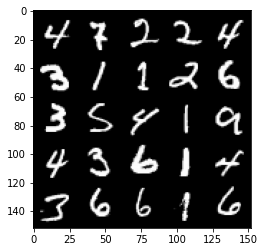

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 2.871974034786225, discriminator loss: 0.18424216233193869


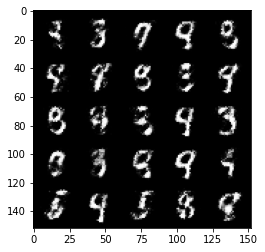

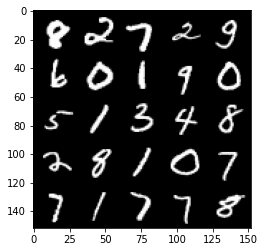

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 2.831574458599092, discriminator loss: 0.19282450184226035


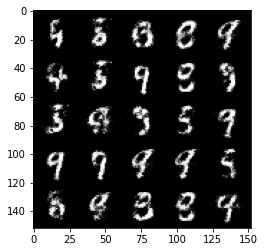

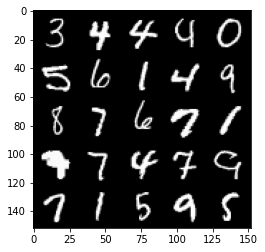

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 2.7576866488456715, discriminator loss: 0.20774506664276113


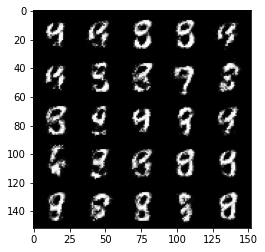

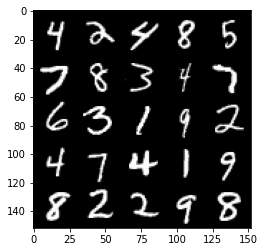

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 2.9185533938407895, discriminator loss: 0.18086008074879642


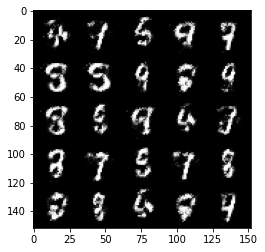

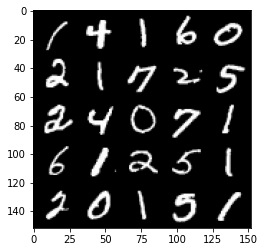

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 2.809384862899777, discriminator loss: 0.19871818341314776


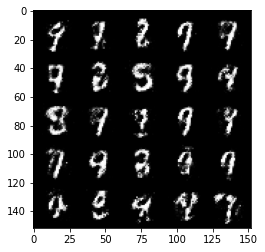

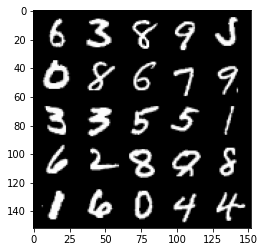

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 2.7934094877243014, discriminator loss: 0.19840489327907568


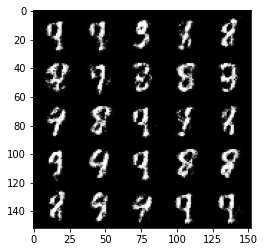

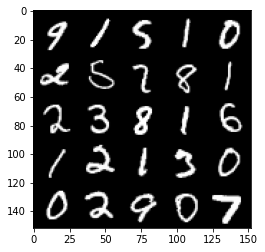

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.764547614097596, discriminator loss: 0.2020786626338959


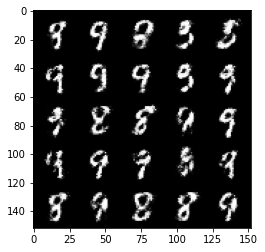

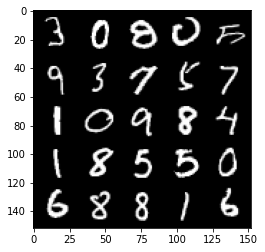

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.5443487906455986, discriminator loss: 0.22634726217389112


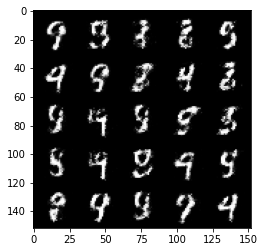

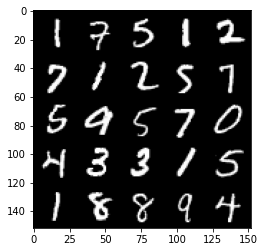

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.6775013394355796, discriminator loss: 0.20768410013616095


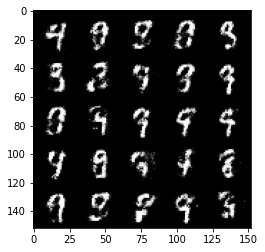

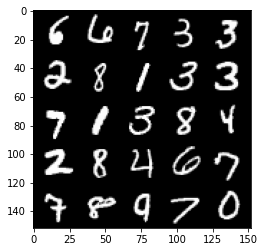

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.773340150356294, discriminator loss: 0.20225118781626228


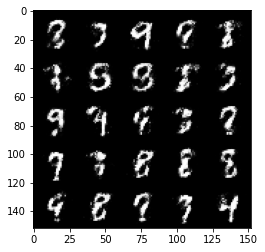

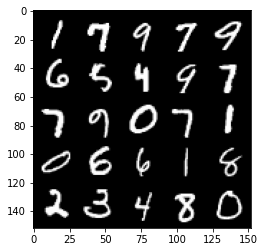

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.5959577836990353, discriminator loss: 0.21894711083173757


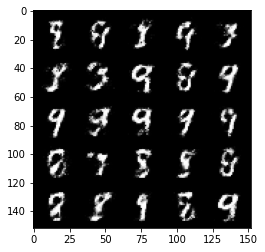

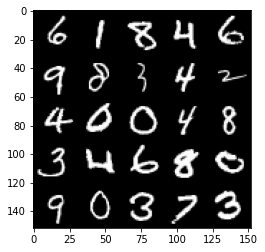

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.616650918960572, discriminator loss: 0.20894006182253366


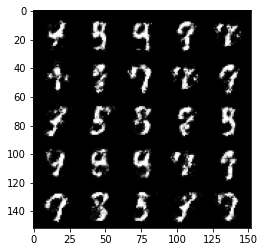

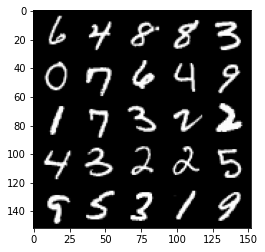

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.7055132927894623, discriminator loss: 0.1989929685592654


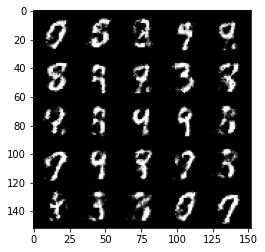

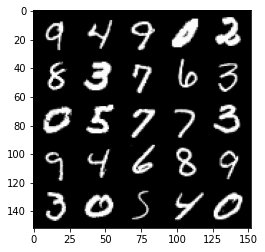

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.6843537850379957, discriminator loss: 0.1962105982005596


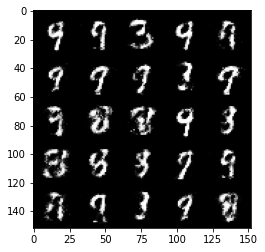

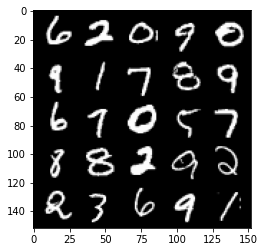

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.677717255115511, discriminator loss: 0.20048875996470464


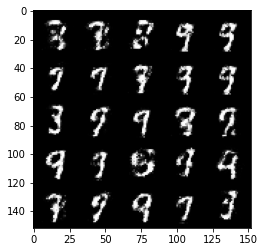

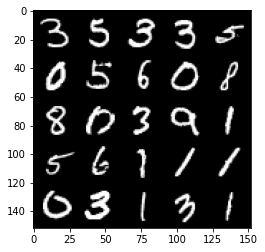

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.570976399898526, discriminator loss: 0.22306823471188547


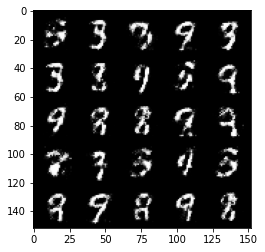

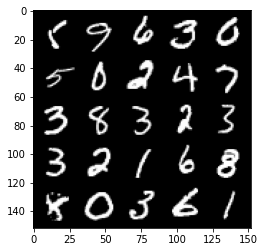

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.553302885055543, discriminator loss: 0.22529157063364988


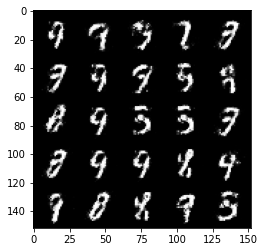

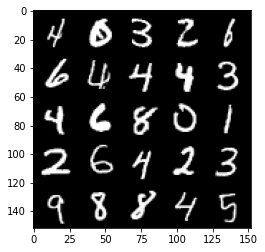

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.561329173564912, discriminator loss: 0.22057841557264338


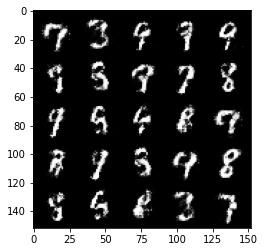

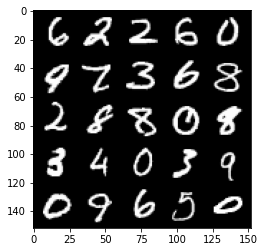

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.496674809932708, discriminator loss: 0.23838358925282963


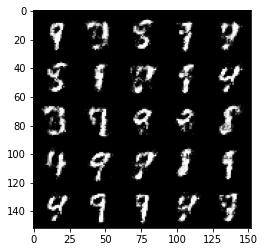

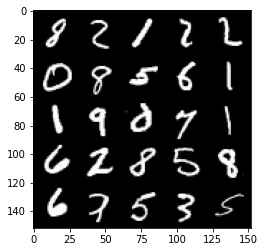

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.393822243213654, discriminator loss: 0.24508691963553422


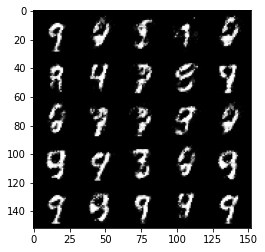

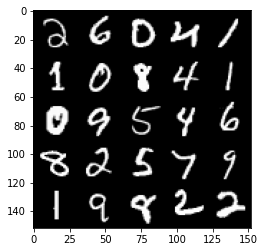

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.4897147579193133, discriminator loss: 0.22803249374032028


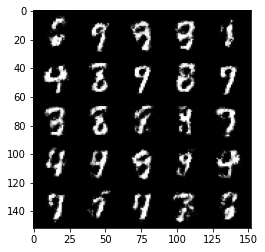

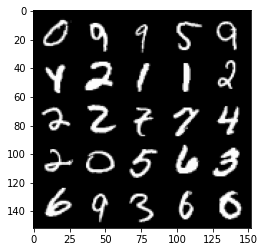

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.3464615805149083, discriminator loss: 0.2580193325579165


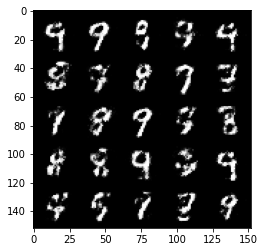

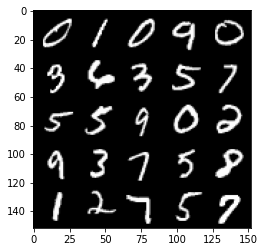

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.3366931278705607, discriminator loss: 0.2530494868755342


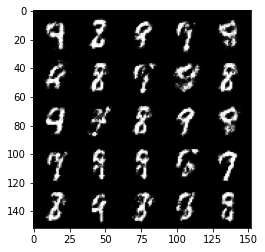

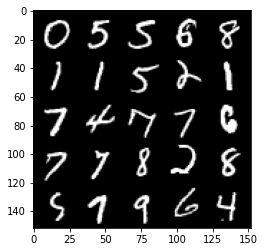

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.205935007095338, discriminator loss: 0.2798107274770736


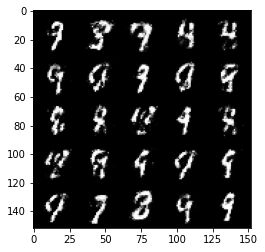

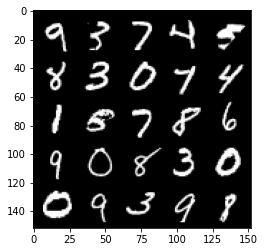

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.3118760139942185, discriminator loss: 0.26096650889515866


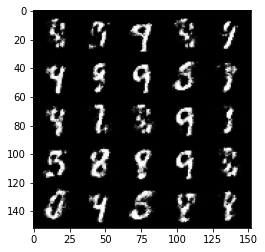

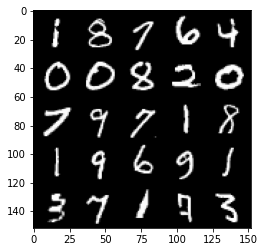

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.2321983883380883, discriminator loss: 0.2627409403920176


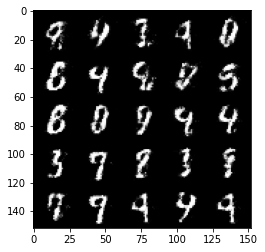

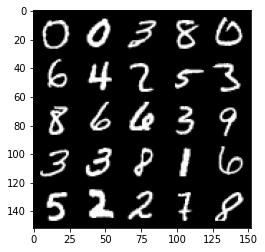

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.3287286112308503, discriminator loss: 0.2514535081386566


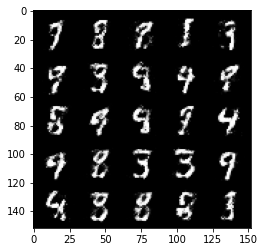

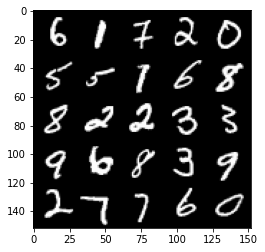

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.2121722104549426, discriminator loss: 0.27701099190115946


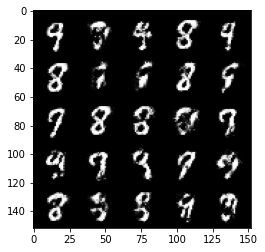

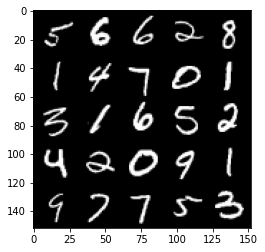

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.139385373830798, discriminator loss: 0.2790124520957468


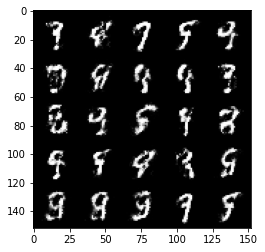

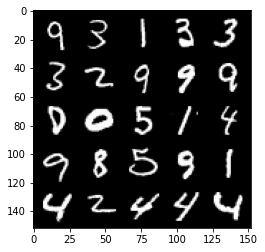

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.2368212676048294, discriminator loss: 0.2667565221786501


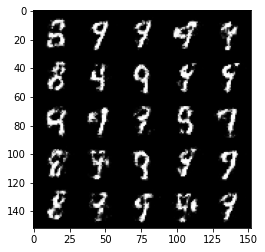

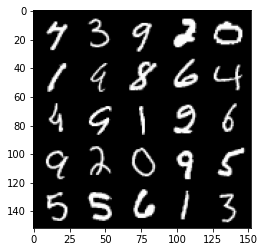

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.189437949657439, discriminator loss: 0.2757043713629246


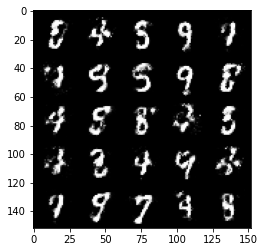

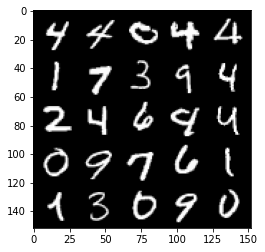

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.1658885433673847, discriminator loss: 0.27543824675679235


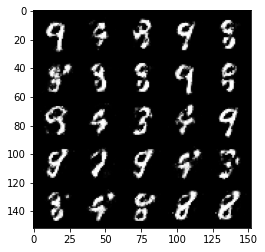

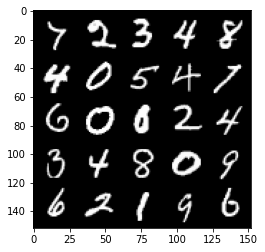

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.2131640536785127, discriminator loss: 0.26946725419163703


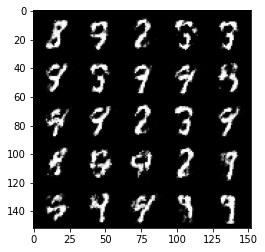

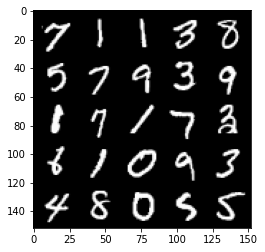

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.151509509086608, discriminator loss: 0.27647027552127845


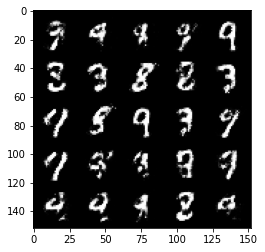

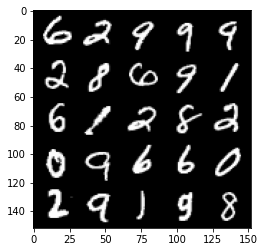

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.2608618853092195, discriminator loss: 0.25462977480888366


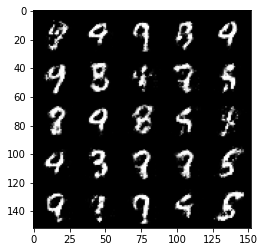

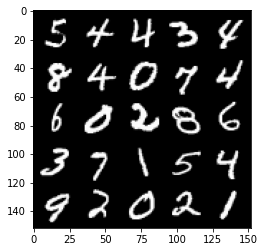

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.1978439831733705, discriminator loss: 0.2767688421905039


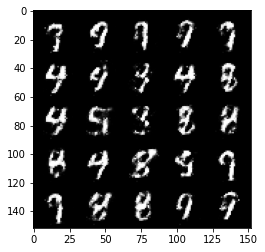

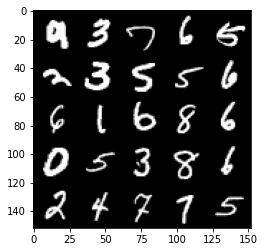

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.1286913285255458, discriminator loss: 0.27974262696504587


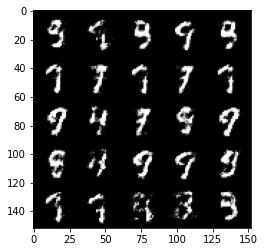

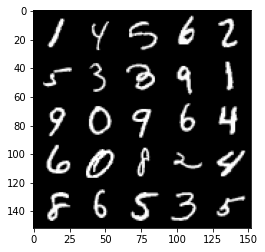

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.005729090929031, discriminator loss: 0.3175948384106159


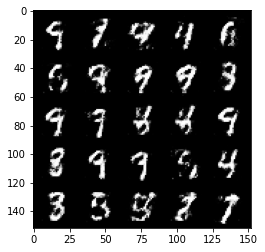

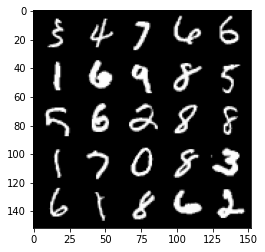

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.020271735191344, discriminator loss: 0.3049290072917938


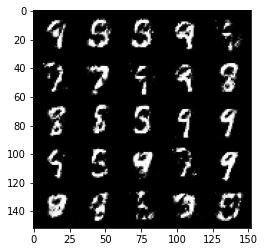

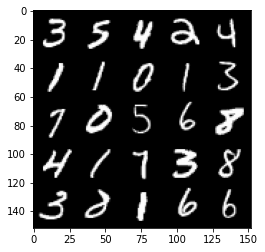

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.13167575764656, discriminator loss: 0.2818610299825667


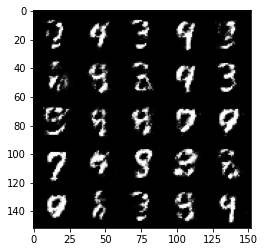

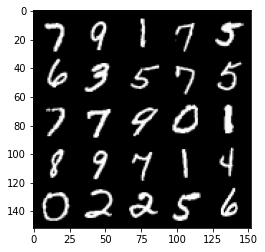

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.1126282062530506, discriminator loss: 0.2938292941749095


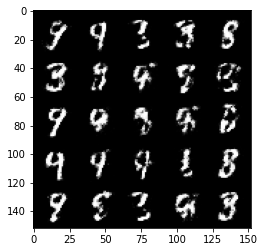

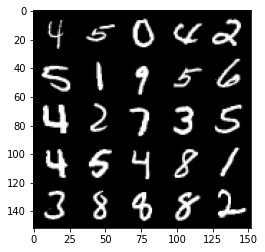

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.0518200867176053, discriminator loss: 0.3157133495211603


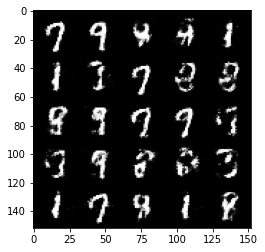

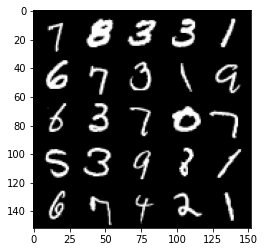

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 1.9714483945369705, discriminator loss: 0.3283686717748644


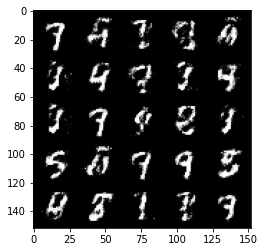

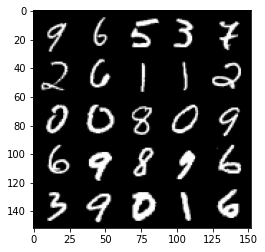

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 1.9912091634273537, discriminator loss: 0.3168438469767568


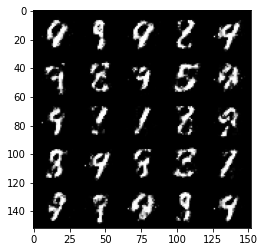

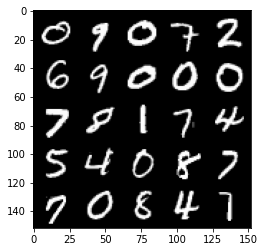

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.003156818389892, discriminator loss: 0.3009136975407602


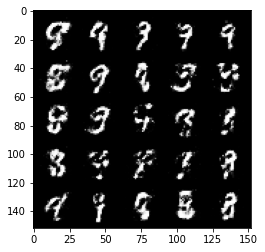

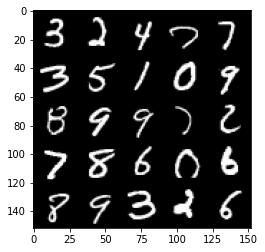

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.011098299264907, discriminator loss: 0.30742471459507953


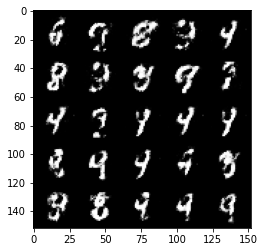

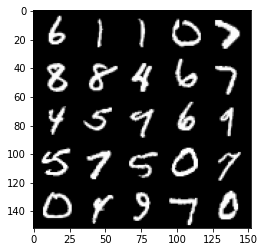

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.003256373643874, discriminator loss: 0.30790742817521066


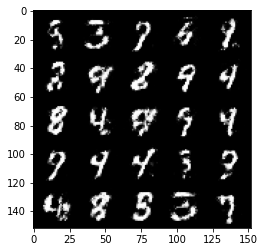

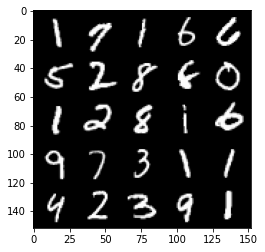

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 1.9154330868721, discriminator loss: 0.32712738576531414


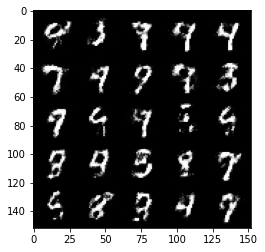

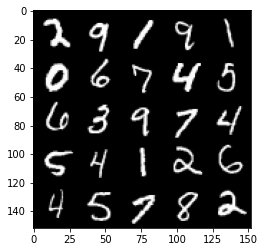

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 1.9174653012752534, discriminator loss: 0.3233566894233227


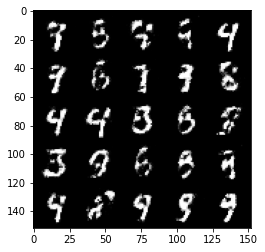

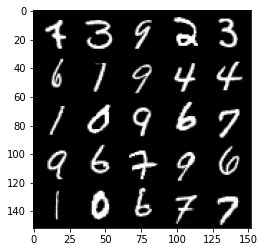

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 1.9234099512100211, discriminator loss: 0.31104744279384616


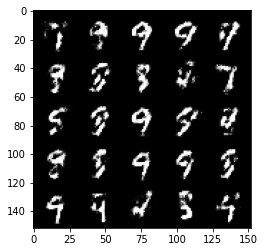

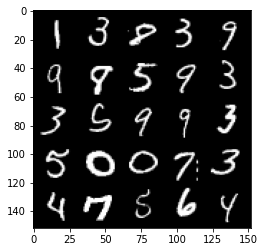

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.8824879040718085, discriminator loss: 0.3315168400406834


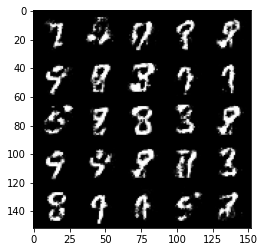

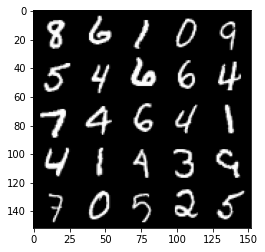

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.9403733775615684, discriminator loss: 0.31552858036756476


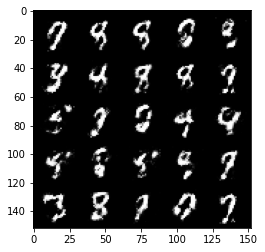

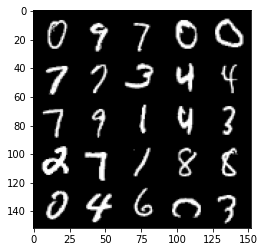

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.9745614676475525, discriminator loss: 0.30363920545578027


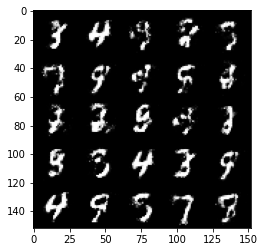

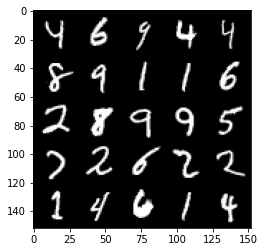

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.915380206108094, discriminator loss: 0.3225996897220611


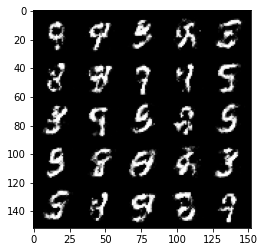

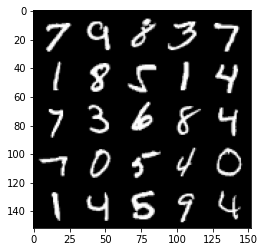

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.9119299180507643, discriminator loss: 0.32788207069039366


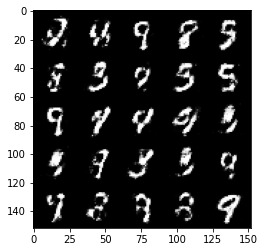

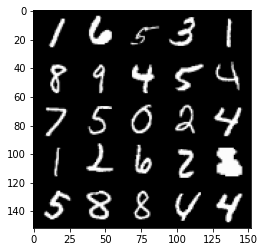

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.8340252852439876, discriminator loss: 0.34756012487411503


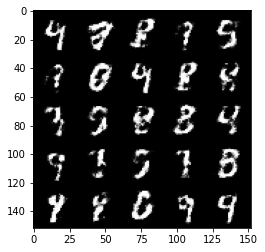

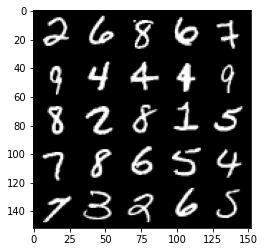

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.8513170354366295, discriminator loss: 0.3316489795446396


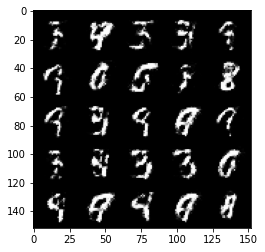

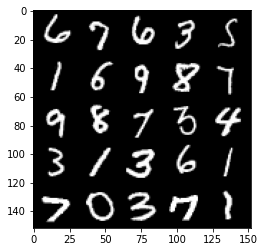

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.9096297512054454, discriminator loss: 0.30867641729116424


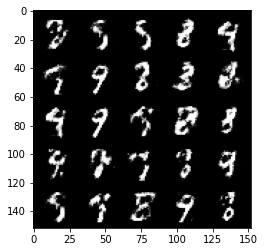

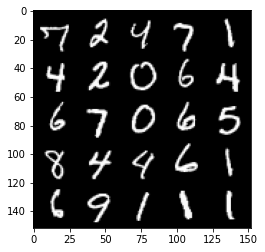

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 2.0090364518165584, discriminator loss: 0.3037547600567347


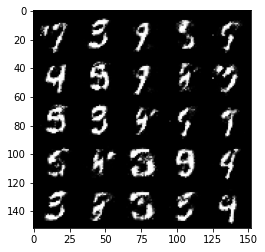

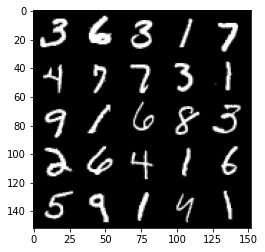

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.8845705008506788, discriminator loss: 0.3340731471776961


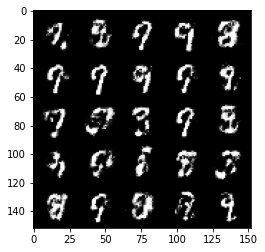

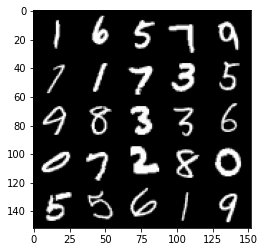

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.9278896005153672, discriminator loss: 0.32498475968837726


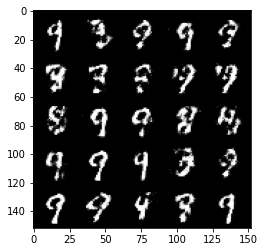

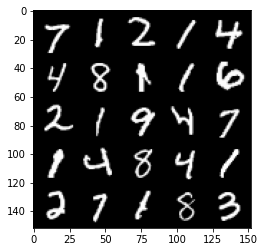

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.8263179957866675, discriminator loss: 0.34464606127142916


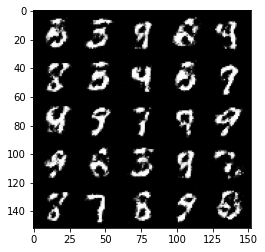

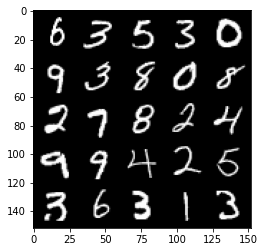

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.842708977460862, discriminator loss: 0.33487523716688133


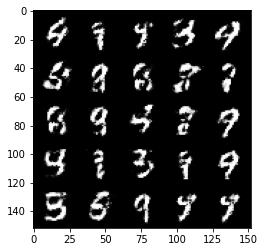

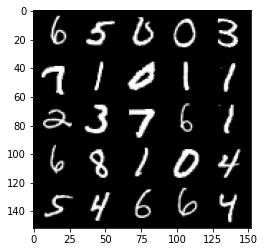

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.893984042406083, discriminator loss: 0.3310684780776499


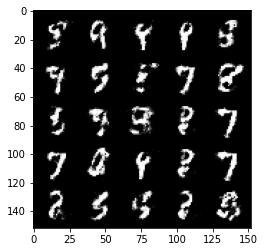

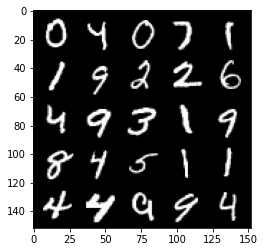

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.973267464876172, discriminator loss: 0.3087083231508732


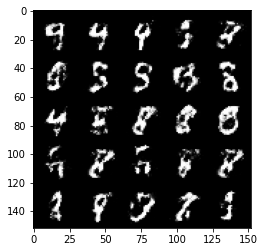

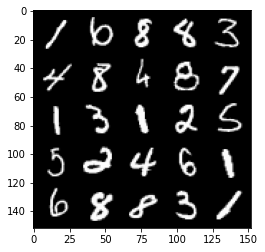

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.8802189731597883, discriminator loss: 0.34648371911048864


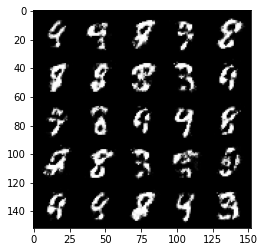

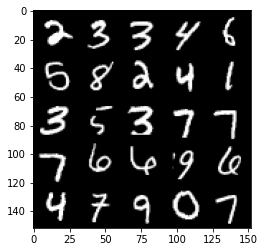

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.7777467260360718, discriminator loss: 0.35307404738664616


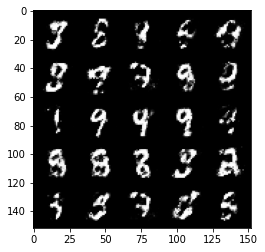

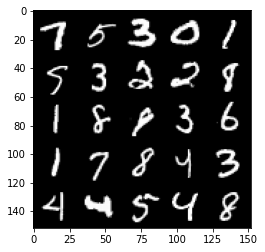

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.7231472189426422, discriminator loss: 0.3611552710533144


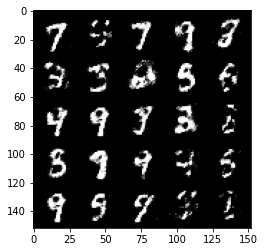

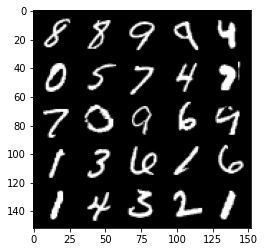

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.7794044733047485, discriminator loss: 0.3381512978374957


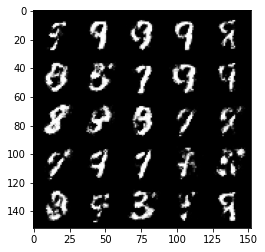

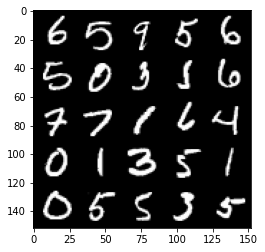

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.8087167692184467, discriminator loss: 0.3347111168503761


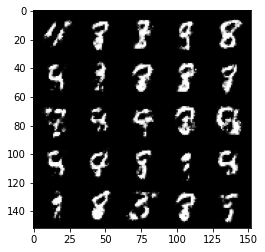

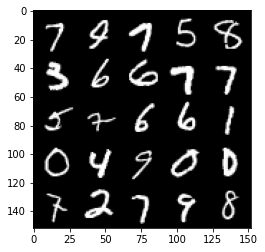

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.8728133740425095, discriminator loss: 0.3216904736757278


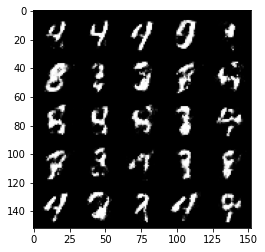

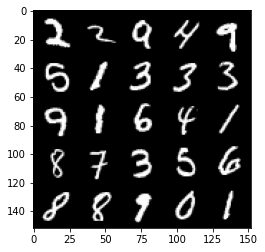

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.8705798976421357, discriminator loss: 0.3282842285037041


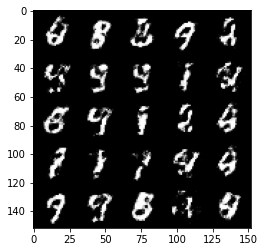

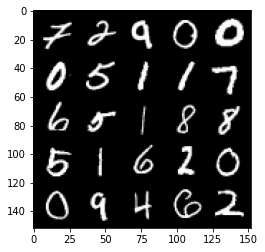

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.7214671044349676, discriminator loss: 0.36252159374952336


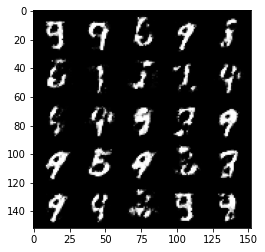

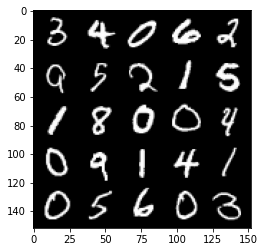

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.7764228937625886, discriminator loss: 0.3486302597820755


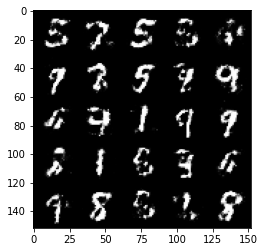

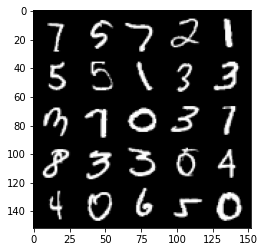

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.8344164352416992, discriminator loss: 0.34547361299395546


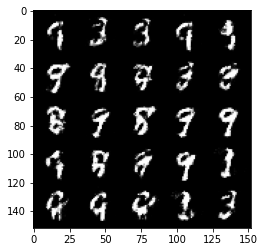

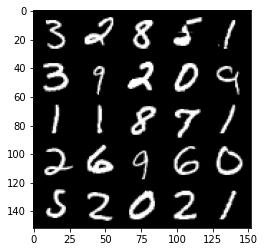

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.7474625792503362, discriminator loss: 0.34654915550351106


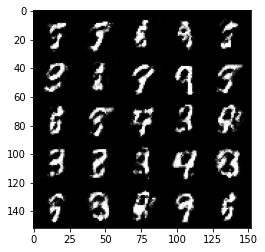

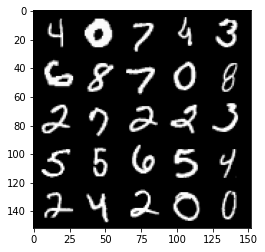

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.8193617844581602, discriminator loss: 0.3449283700585365


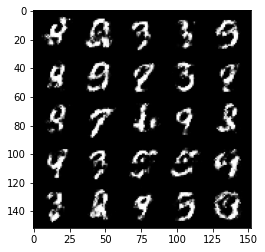

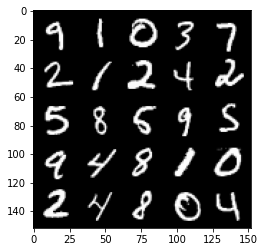

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.6456412162780762, discriminator loss: 0.38115528368949914


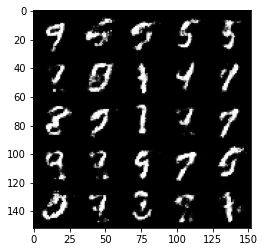

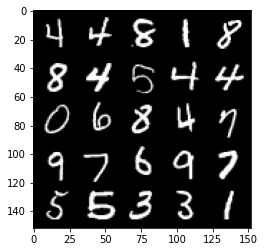

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.6940553486347187, discriminator loss: 0.3597583740353583


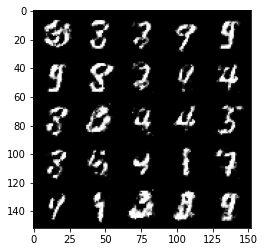

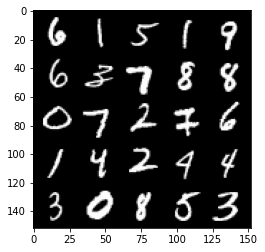

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.6086415584087381, discriminator loss: 0.3843849409222602


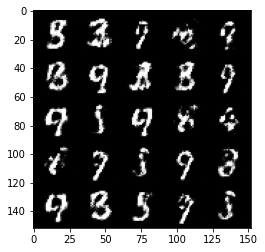

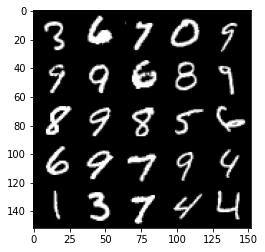

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.6960278632640844, discriminator loss: 0.3672979890108112


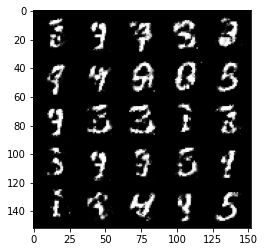

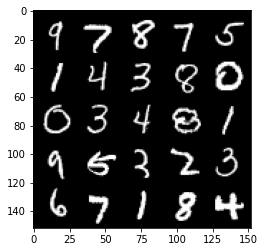

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.774444191694258, discriminator loss: 0.3498520780205727


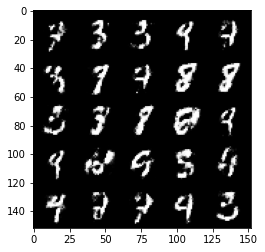

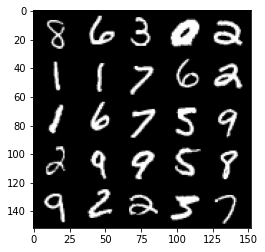

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.6999765436649332, discriminator loss: 0.3681703352332115


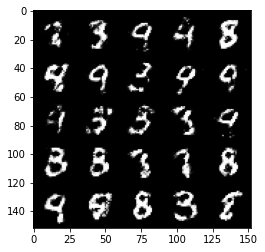

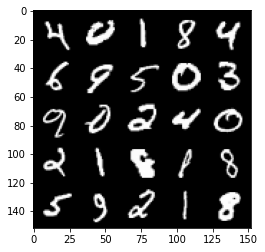

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.6486944413185123, discriminator loss: 0.3560822884440424


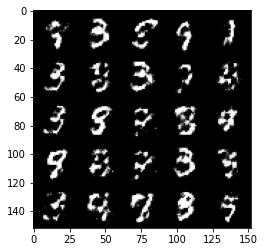

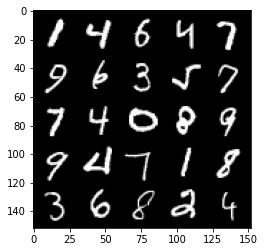

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.646518017292021, discriminator loss: 0.3671168089509008


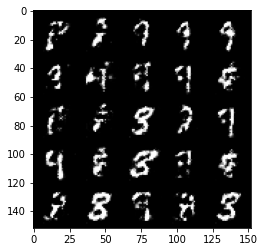

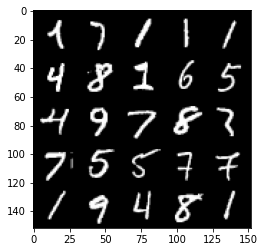

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.724587000846863, discriminator loss: 0.3518893445730214


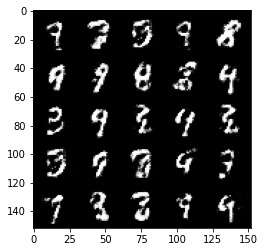

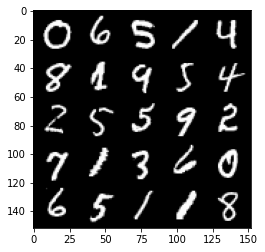

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.7998407475948315, discriminator loss: 0.3364431475996971


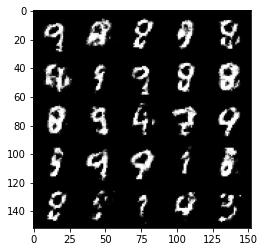

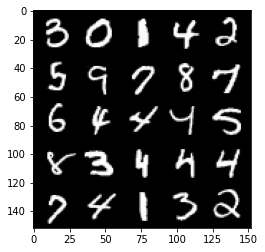

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.6636433186531063, discriminator loss: 0.38037234187126184


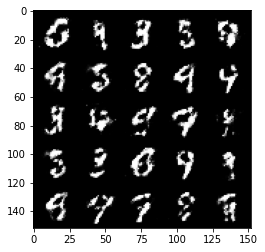

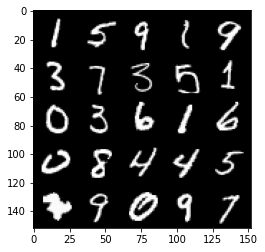

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.638093508958817, discriminator loss: 0.38643459528684665


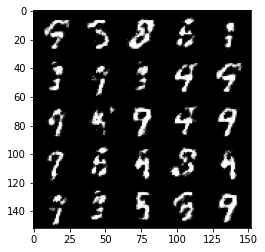

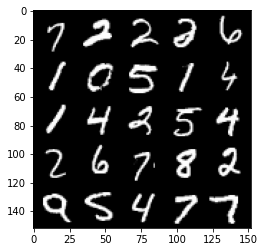

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.7234249107837676, discriminator loss: 0.35236476576328324


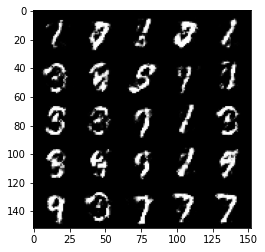

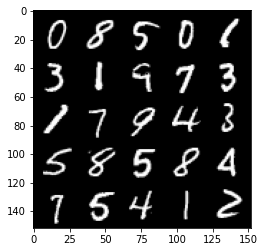

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.64857748389244, discriminator loss: 0.3843825404047965


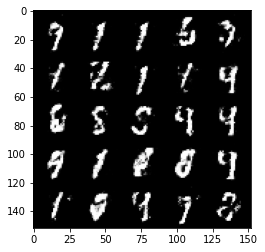

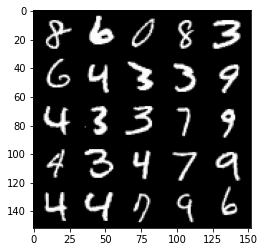

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.719689516067504, discriminator loss: 0.3577297654747961


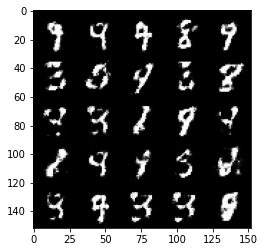

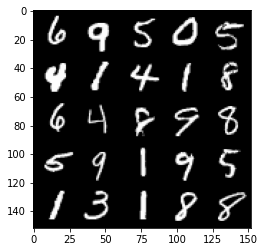

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.6341233665943145, discriminator loss: 0.37339256715774505


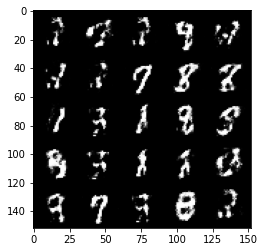

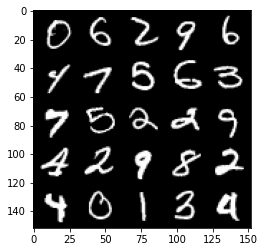

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.6929588286876676, discriminator loss: 0.3478065485358239


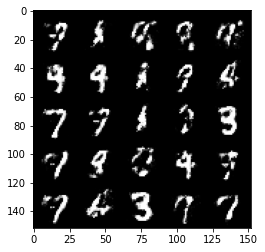

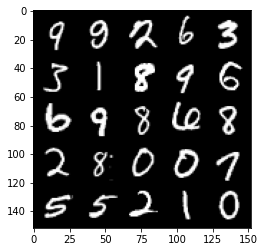

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.6835150611400602, discriminator loss: 0.3506634001731872


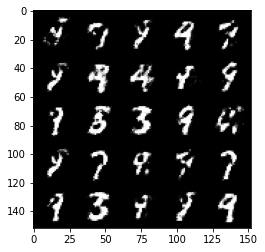

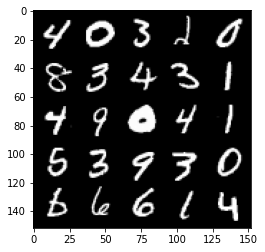

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.8137183086872102, discriminator loss: 0.32351709675788887


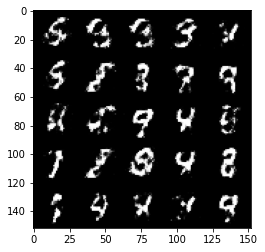

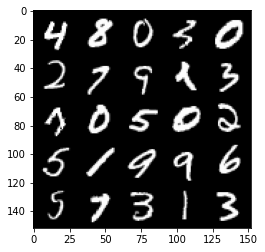

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.7669203648567207, discriminator loss: 0.3525334665179255


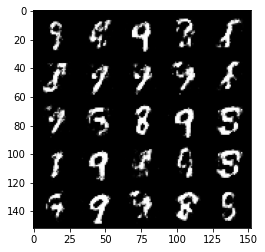

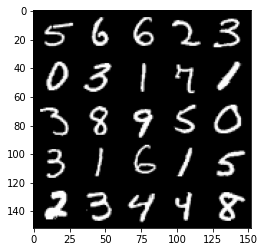

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.700038301229477, discriminator loss: 0.35985196450352663


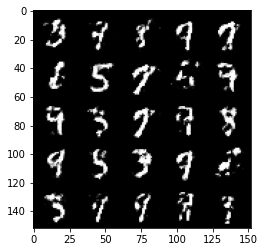

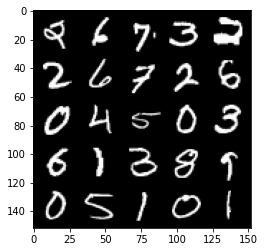

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.674676493406295, discriminator loss: 0.37362357228994403


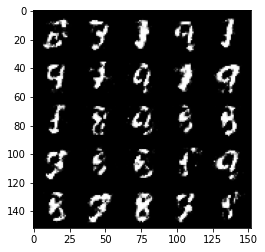

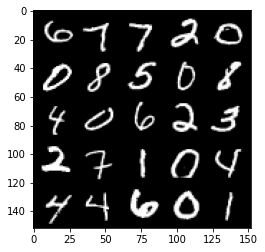

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.6671393592357635, discriminator loss: 0.3818822206258773


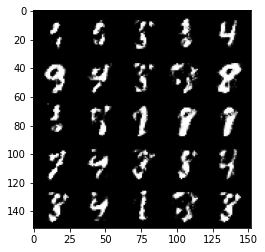

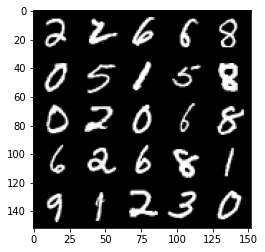

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.5724012477397908, discriminator loss: 0.38508287078142156


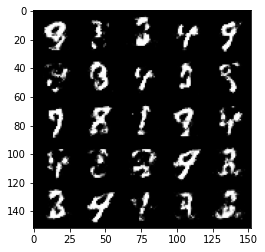

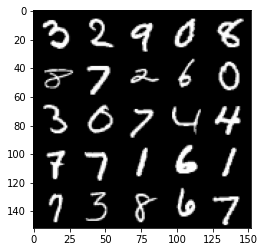

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.6122486040592183, discriminator loss: 0.3897393145561217


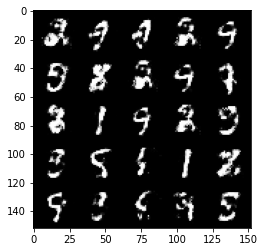

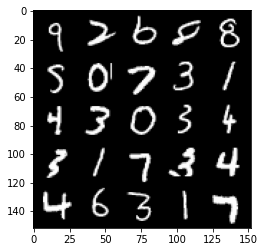

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.5674117832183851, discriminator loss: 0.3965114501714704


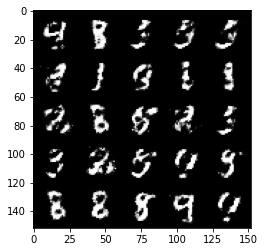

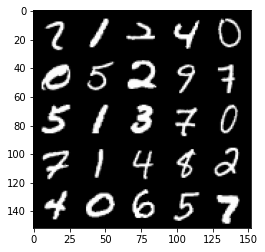

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.5844925916194907, discriminator loss: 0.38818723523616766


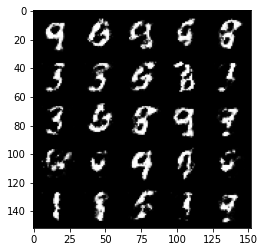

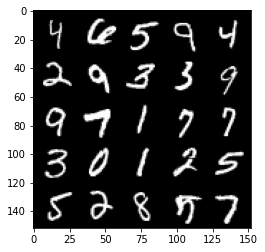

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.6460344419479374, discriminator loss: 0.38171491175889977


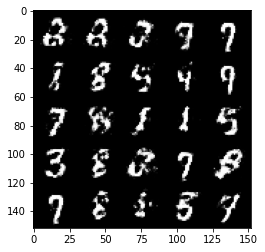

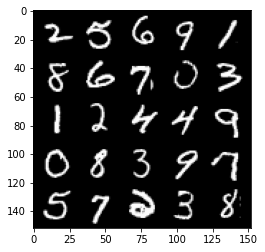

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.5600441813468924, discriminator loss: 0.40033832234144195


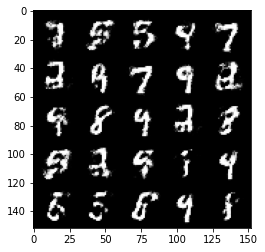

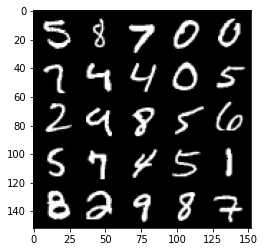

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.5288866577148457, discriminator loss: 0.4144617693424229


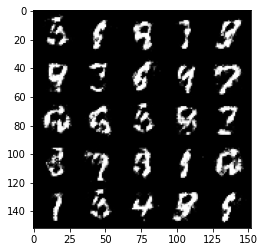

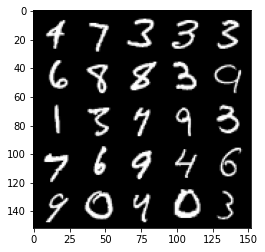

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.5707610383033759, discriminator loss: 0.3911702756881714


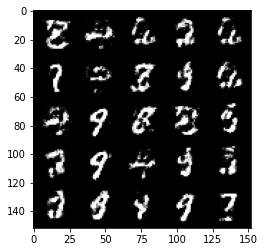

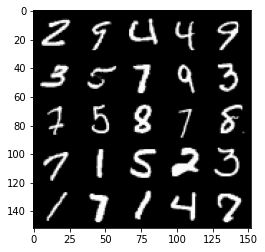

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.5996745543479929, discriminator loss: 0.3891838116645811


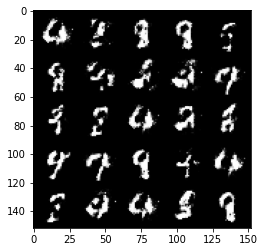

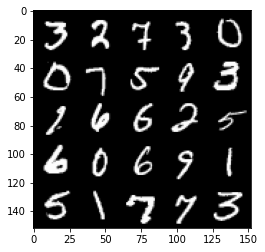

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.660290282011033, discriminator loss: 0.3622013733386998


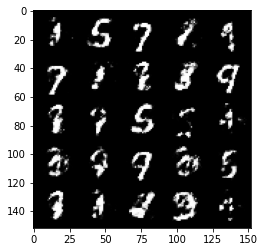

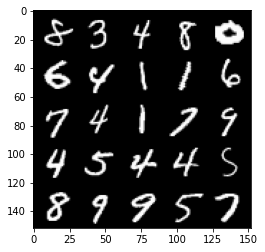

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.6712782676219946, discriminator loss: 0.36677217257022887


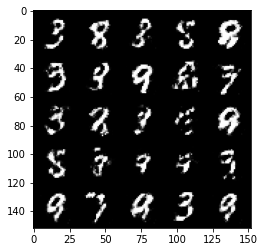

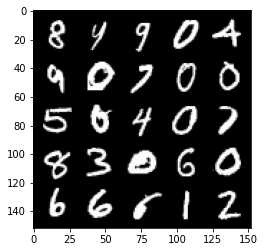

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.607057285070419, discriminator loss: 0.3770696866512295


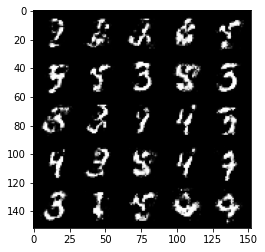

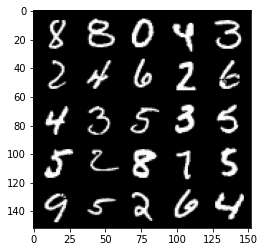

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.6772889962196356, discriminator loss: 0.36171942907571797


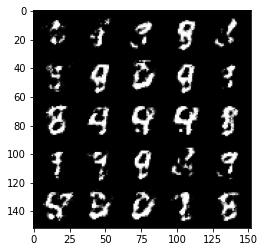

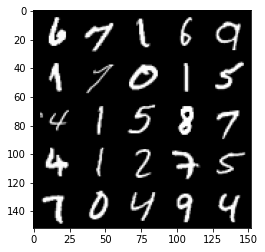

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.6622969105243675, discriminator loss: 0.37832121539115904


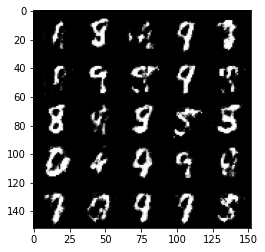

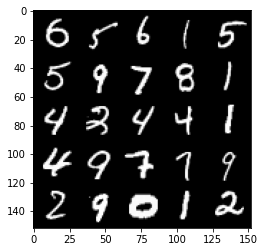

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.6124367599487315, discriminator loss: 0.3787548184394833


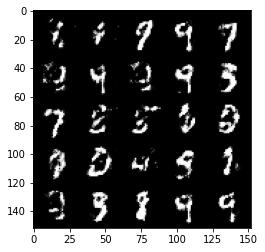

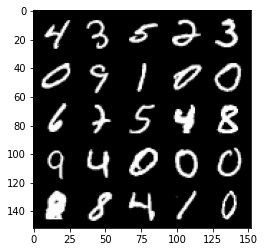

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.5944916498661035, discriminator loss: 0.38480352383851985


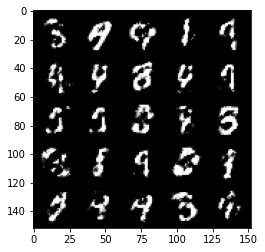

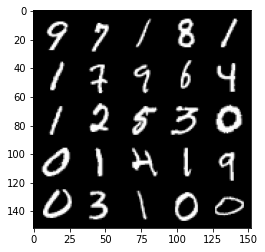

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.5767050719261173, discriminator loss: 0.38684839552640904


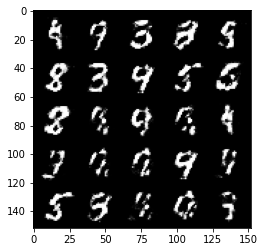

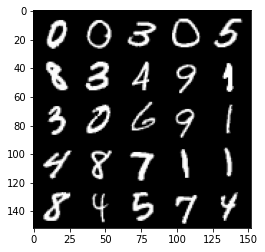

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.6483792314529422, discriminator loss: 0.36401556104421573


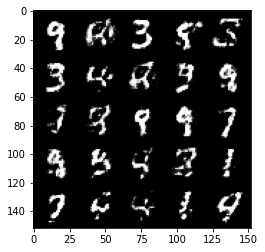

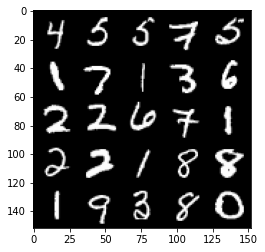

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.5827603254318245, discriminator loss: 0.40079384934902224


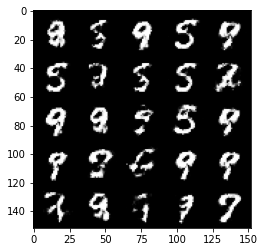

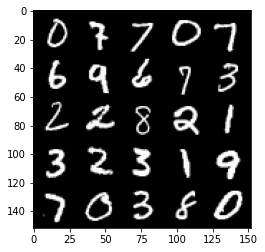

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.5552007162570953, discriminator loss: 0.40026185083389254


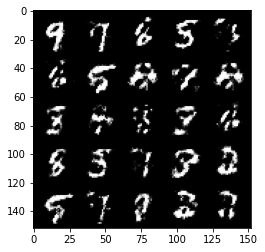

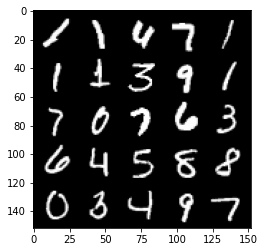

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.513787674188613, discriminator loss: 0.3913250705599783


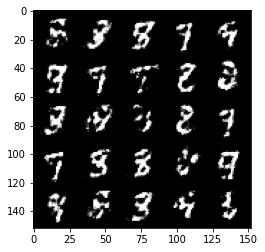

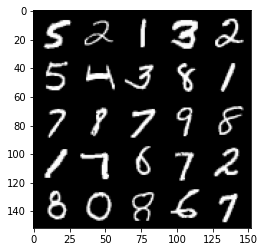

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.563070135593413, discriminator loss: 0.4087642689943317


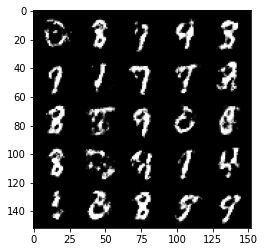

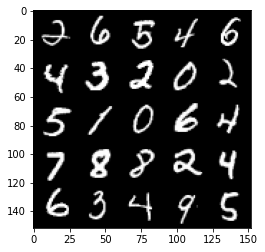

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.4260198221206655, discriminator loss: 0.43056927812099466


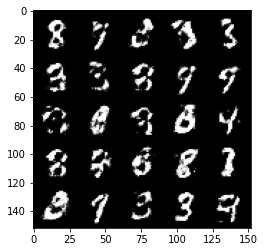

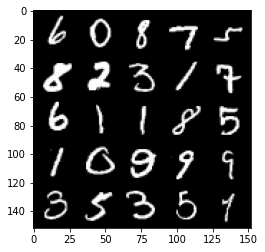

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.4590519664287565, discriminator loss: 0.4257846866846085


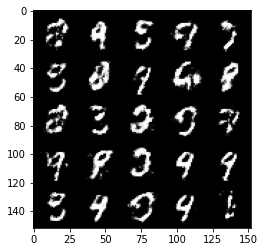

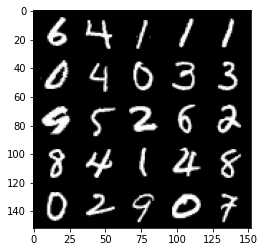

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.437345981121064, discriminator loss: 0.4264736651778225


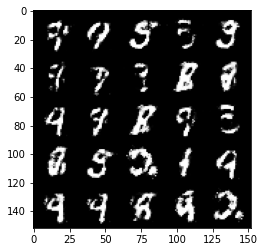

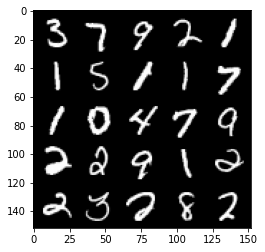

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.4728704509735113, discriminator loss: 0.40803822690248504


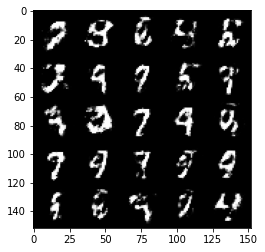

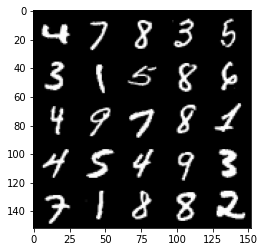

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.4895260040760048, discriminator loss: 0.408703139424324


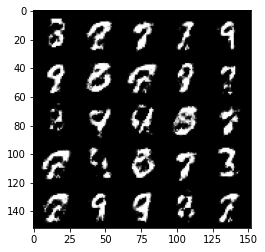

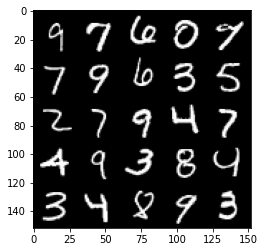

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.3277245483398434, discriminator loss: 0.4605382547974585


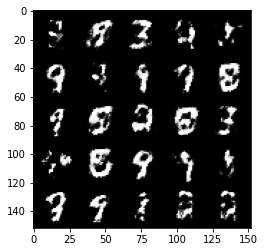

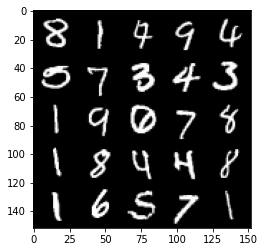

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.415118767023087, discriminator loss: 0.4193890792727468


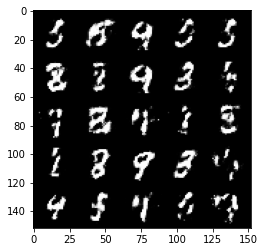

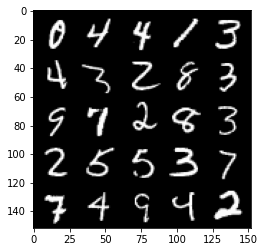

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.5490001468658452, discriminator loss: 0.3885573475956918


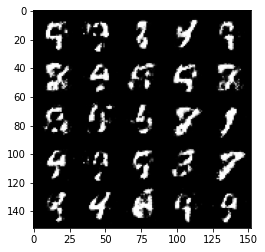

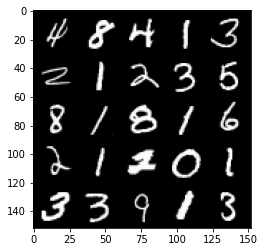

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.5393919558525095, discriminator loss: 0.4069489045739174


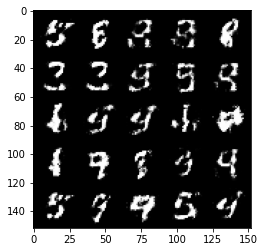

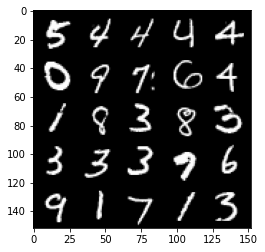

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.534417553186416, discriminator loss: 0.4084091991782191


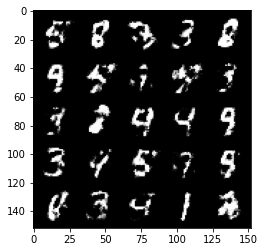

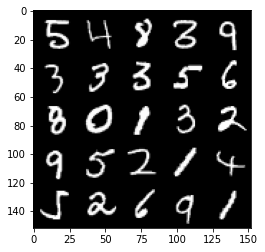

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.5230315568447115, discriminator loss: 0.40458097046613734


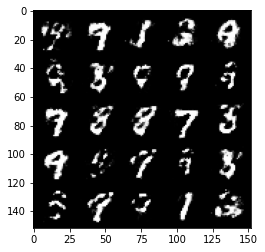

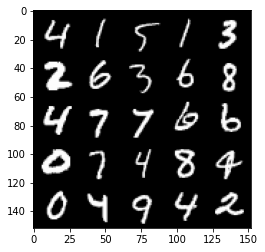

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.3679973585605636, discriminator loss: 0.44226151949167236


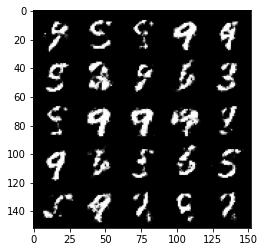

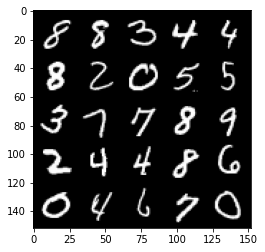

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.444330024480822, discriminator loss: 0.4130098522305489


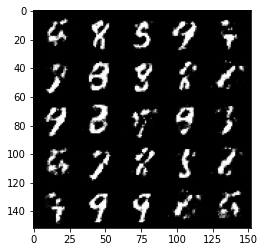

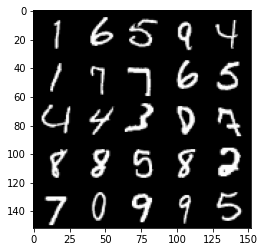

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.4251255772113804, discriminator loss: 0.4382246625423433


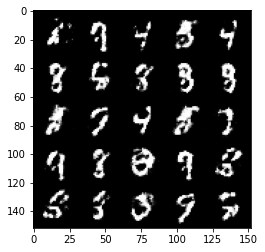

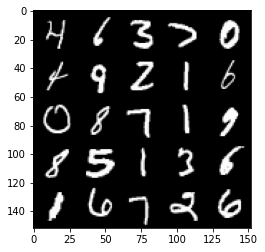

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.4550053791999809, discriminator loss: 0.41550102162361113


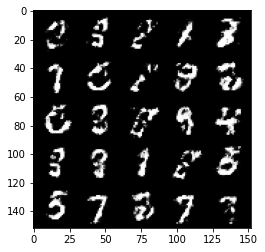

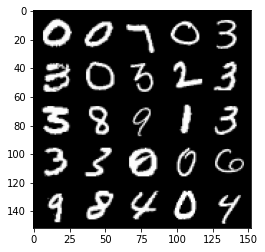

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.3988044533729562, discriminator loss: 0.4522492806315414


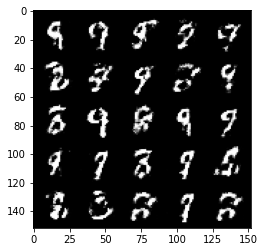

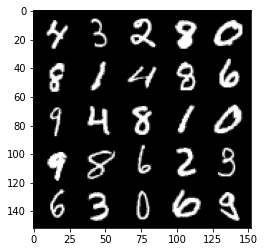

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.3590481698513017, discriminator loss: 0.4503269399404527


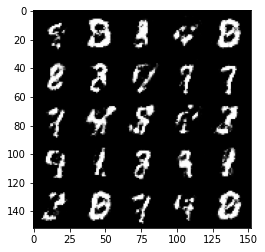

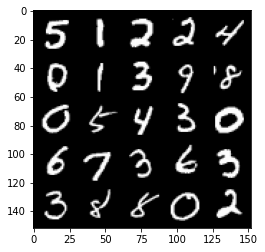

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.4153196954727174, discriminator loss: 0.43139276045560815


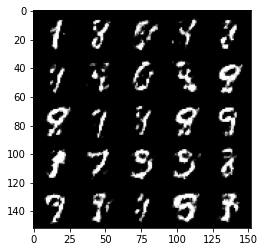

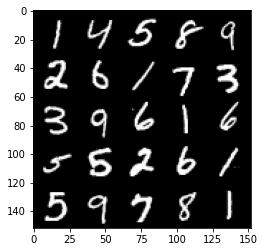

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.410747221469879, discriminator loss: 0.42108570069074597


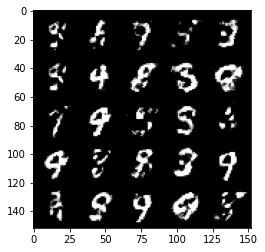

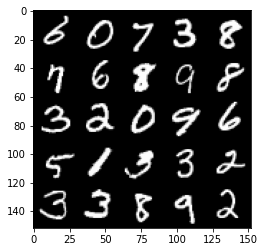

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.439730690002442, discriminator loss: 0.41991275328397765


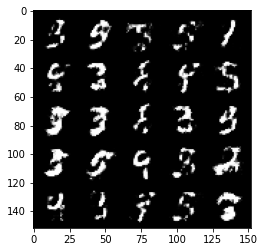

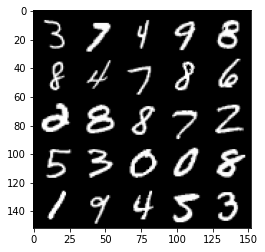

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.4204365584850311, discriminator loss: 0.4318403457403184


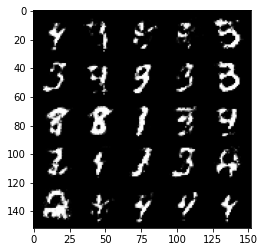

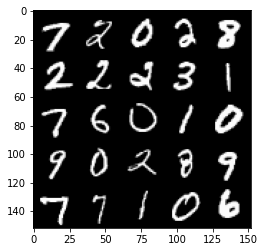

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 1.3624813516139977, discriminator loss: 0.4397576301693919


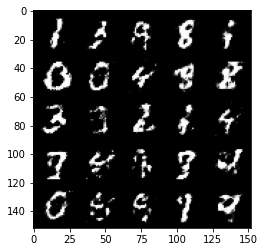

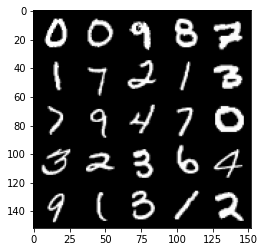

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.3575564923286434, discriminator loss: 0.449929555773735


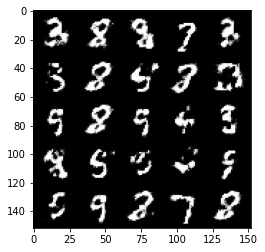

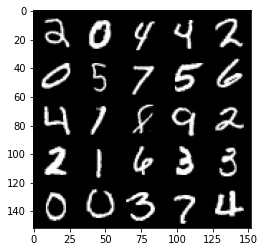

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.392766136169433, discriminator loss: 0.4484027608036997


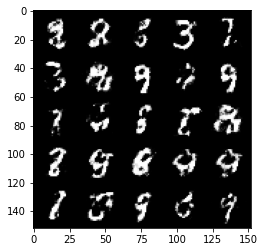

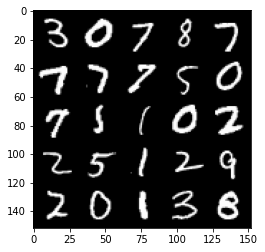

In [20]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1